In [2]:
import numpy as np
import pandas as pd
import scipy
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn import datasets, metrics
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from sklearn.mixture import GaussianMixture
from sklearn.manifold import TSNE
import time
from sklearn.datasets import fetch_openml
#import umap
from scipy.spatial.distance import cdist

In [3]:
# Source:
# http://blog.nextgenetics.net/?e=102
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
if (code_show){
$('div.input').hide();
} else {
$('div.input').show();
}
code_show = !code_show} 
$( document ).ready(code_toggle);
</script>
The raw code for this IPython notebook is by default hidden for easier reading.
To toggle on/off the raw code, click <a href="javascript:code_toggle()">here</a>.''')

### Unsupervised Learning Capstone
# Spotify Music Genres
### Nick Chused
### April 6, 2020
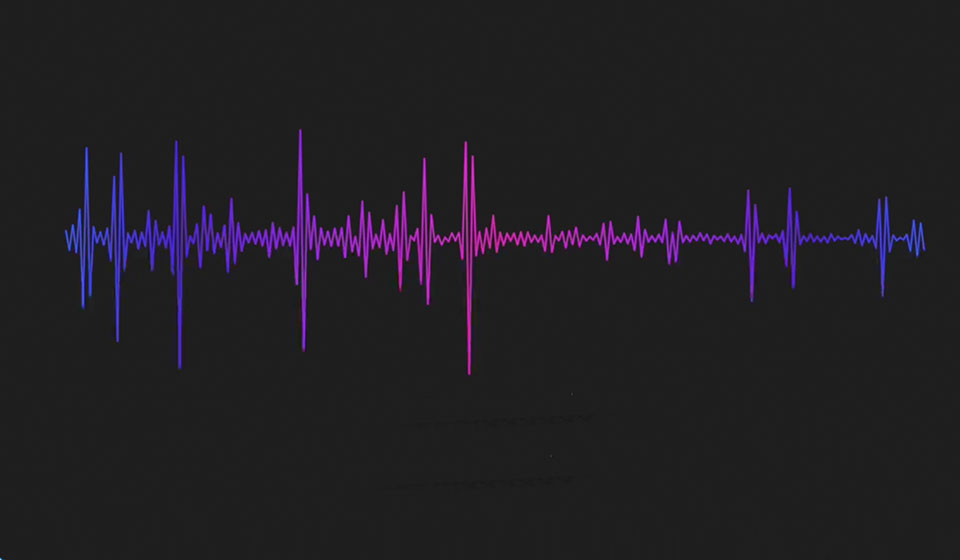

## Spotify is trying to segment their songs into genres based on song characteristics

In [4]:
from google.colab import files
files.upload()

ModuleNotFoundError: No module named 'google'

In [4]:
spotify = pd.read_csv('SpotifyFeatures.csv')

#### duration_ms:  The duration of the track in milliseconds

#### key: The estimated overall key of the track (A through G)

#### mode:  The modality (major or minor) of a track

#### time_signature:  How many beats are in each bar

#### acousticness:  A confidence measure from 0.0 to 1.0 of whether the track is acoustic

#### danceability:  How suitable a track is for dancing based on a combination of musical elements including tempo, rhythm stability, beat strength, and overall regularity

#### energy:  A perceptual measure of intensity and activity. Energetic tracks feel fast, loud, and noisy.  (high energy: death metal / low energy: Back prelude)

#### instrumentalness:  Predicts whether a track contains vocals.  (rap or spoken word tracks are clearly “vocal”)

#### liveness:  Detects the presence of an audience in the recording

#### loudness:  The overall loudness of a track in decibels (dB)

####  speechiness:  The presence of spoken words in a track. (high speechiness: talk show, audio book, poetry)

#### valence: The musical positiveness conveyed by a track. High valence sound more positive (e.g. happy, cheerful, euphoric),  low valence sound more negative (e.g. sad, depressed, angry)

#### tempo:  The overall estimated tempo of a track in beats per minute (BPM)

### See a more thorough definition of features here: https://developer.spotify.com/documentation/web-api/reference/tracks/get-audio-features/

## Let's take a quick look at the dataset:

In [5]:
spotify

,genre,artist_name,track_name,track_id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
0,Movie,Henri Salvador,C'est beau de faire un Show,0BRjO6ga9RKCKjfDqeFgWV,0,0.61100,0.389,99373,0.910,0.000000,C#,0.3460,-1.828,Major,0.0525,166.969,4/4,0.814
1,Movie,Martin & les fées,Perdu d'avance (par Gad Elmaleh),0BjC1NfoEOOusryehmNudP,1,0.24600,0.590,137373,0.737,0.000000,F#,0.1510,-5.559,Minor,0.0868,174.003,4/4,0.816
2,Movie,Joseph Williams,Don't Let Me Be Lonely Tonight,0CoSDzoNIKCRs124s9uTVy,3,0.95200,0.663,170267,0.131,0.000000,C,0.1030,-13.879,Minor,0.0362,99.488,5/4,0.368
3,Movie,Henri Salvador,Dis-moi Monsieur Gordon Cooper,0Gc6TVm52BwZD07Ki6tIvf,0,0.70300,0.240,152427,0.326,0.000000,C#,0.0985,-12.178,Major,0.0395,171.758,4/4,0.227
4,Movie,Fabien Nataf,Ouverture,0IuslXpMROHdEPvSl1fTQK,4,0.95000,0.331,82625,0.225,0.123000,F,0.2020,-21.150,Major,0.0456,140.576,4/4,0.390
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
232720,Soul,Slave,Son Of Slide,2XGLdVl7lGeq8ksM6Al7jT,39,0.00384,0.687,326240,0.714,0.544000,D,0.0845,-10.626,Major,0.0316,115.542,4/4,0.962
232721,Soul,Jr Thomas & The Volcanos,Burning Fire,1qWZdkBl4UVPj9lK6HuuFM,38,0.03290,0.785,282447,0.683,0.000880,E,0.2370,-6.944,Minor,0.0337,113.830,4/4,0.969
232722,Soul,Muddy Waters,(I'm Your) Hoochie Coochie Man,2ziWXUmQLrXTiYjCg2fZ2t,47,0.90100,0.517,166960,0.419,0.000000,D,0.0945,-8.282,Major,0.1480,84.135,4/4,0.813
232723,Soul,R.LUM.R,With My Words,6EFsue2YbIG4Qkq8Zr9Rir,44,0.26200,0.745,222442,0.704,0.000000,A,0.3330,-7.137,Major,0.1460,100.031,4/4,0.489


### The dataset contains 26 genres of music:

In [6]:
types = ('Alternative', 'Country', 'Dance', 'Electronic', 'Folk', 'Rap', 'Classical', 'Reggae', 'Jazz', 'Rock')
music = spotify[spotify.genre.isin(types)]
music

,genre,artist_name,track_name,track_id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
671,Alternative,Joji,Sanctuary,3xaugmCyXrVkrDTXbFkMW3,83,0.4220,0.552,180019,0.650,0.000275,C#,0.3720,-7.199,Major,0.1280,167.788,4/4,0.316
672,Alternative,Joji,SLOW DANCING IN THE DARK,0rKtyWc8bvkriBthvHKY8d,81,0.5440,0.515,209274,0.479,0.005980,D#,0.1910,-7.458,Major,0.0261,88.964,4/4,0.284
673,Alternative,Joji,YEAH RIGHT,1VGzxJnVQND7Cg5H5wGj14,76,0.6190,0.672,174358,0.588,0.241000,C#,0.0992,-9.573,Major,0.1330,169.033,4/4,0.204
674,Alternative,Oliver Tree,Alien Boy,1gGhqfs2pDTOI30AEXMXrn,73,0.1110,0.803,163525,0.599,0.000000,C#,0.2360,-5.169,Major,0.0985,130.107,4/4,0.484
675,Alternative,Joji,CAN'T GET OVER YOU (feat. Clams Casino),39oeKRgsLeynDIbWuXyA47,74,0.6840,0.900,107077,0.316,0.077100,A,0.0853,-8.797,Major,0.3320,129.914,4/4,0.844
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
226503,Rock,The Beatles,No Reply - Remastered 2009,4ltC6PrqkTtpcRNi5lvS4z,58,0.6700,0.718,136067,0.593,0.000000,C,0.1720,-9.976,Major,0.0377,124.251,4/4,0.869
226504,Rock,QUEEN BEE,Fire,3xVCQGla5LLhrwqNS2FcHo,60,0.0340,0.521,215973,0.933,0.000021,B,0.3300,-4.874,Minor,0.1790,169.842,4/4,0.607
226505,Rock,Freedom Fry,Awake,47ed9eO66cBHvWteLlF7C0,59,0.6710,0.618,194000,0.769,0.241000,B,0.2760,-4.642,Minor,0.0309,111.978,4/4,0.607
226506,Rock,Beck,Girl,3DgNj1aYbSRVoVO8yX7DRt,51,0.0543,0.681,209893,0.662,0.005120,G#,0.2060,-6.526,Major,0.1150,149.485,4/4,0.850


In [7]:
spotify.genre.unique()

array(['Movie', 'R&B', 'A Capella', 'Alternative', 'Country', 'Dance',
       'Electronic', 'Anime', 'Folk', 'Blues', 'Opera', 'Hip-Hop',
       "Children's Music", 'Children’s Music', 'Rap', 'Indie',
       'Classical', 'Pop', 'Reggae', 'Reggaeton', 'Jazz', 'Rock', 'Ska',
       'Comedy', 'Soul', 'Soundtrack', 'World'], dtype=object)

### I sub-sampled the dataset to focus on ten specific genres

In [8]:
music.genre.unique()

array(['Alternative', 'Country', 'Dance', 'Electronic', 'Folk', 'Rap',
       'Classical', 'Reggae', 'Jazz', 'Rock'], dtype=object)

### Initially the dataset contained around 9,000 songs for each genre

In [9]:
music.genre.value_counts()

Jazz           9441
Electronic     9377
Folk           9299
Rock           9272
Alternative    9263
Classical      9256
Rap            9232
Reggae         8771
Dance          8701
Country        8664
Name: genre, dtype: int64

### so I sub-sampled the dataset to contain 1000 examples of each genre of song

In [10]:
for genre in music.genre.unique():
   music.drop(music[music.genre == genre][1000:].index, inplace=True)

/Users/NicholasChused/opt/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:4102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [11]:
music.genre.value_counts()

Reggae         1000
Electronic     1000
Rap            1000
Classical      1000
Rock           1000
Folk           1000
Country        1000
Dance          1000
Alternative    1000
Jazz           1000
Name: genre, dtype: int64

In [7]:
music

,genre,artist_name,track_name,track_id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
671,Alternative,Joji,Sanctuary,3xaugmCyXrVkrDTXbFkMW3,83,0.42200,0.552,180019,0.650,0.000275,C#,0.3720,-7.199,Major,0.1280,167.788,4/4,0.316
672,Alternative,Joji,SLOW DANCING IN THE DARK,0rKtyWc8bvkriBthvHKY8d,81,0.54400,0.515,209274,0.479,0.005980,D#,0.1910,-7.458,Major,0.0261,88.964,4/4,0.284
673,Alternative,Joji,YEAH RIGHT,1VGzxJnVQND7Cg5H5wGj14,76,0.61900,0.672,174358,0.588,0.241000,C#,0.0992,-9.573,Major,0.1330,169.033,4/4,0.204
674,Alternative,Oliver Tree,Alien Boy,1gGhqfs2pDTOI30AEXMXrn,73,0.11100,0.803,163525,0.599,0.000000,C#,0.2360,-5.169,Major,0.0985,130.107,4/4,0.484
675,Alternative,Joji,CAN'T GET OVER YOU (feat. Clams Casino),39oeKRgsLeynDIbWuXyA47,74,0.68400,0.900,107077,0.316,0.077100,A,0.0853,-8.797,Major,0.3320,129.914,4/4,0.844
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
153983,Rock,A Perfect Circle,Counting Bodies Like Sheep To The Rhythm Of Th...,3mhhCui69mtJnRhLDoIi2f,52,0.04620,0.632,336440,0.938,0.005600,G#,0.0981,-6.999,Major,0.3390,135.779,4/4,0.227
153984,Rock,Kid Bloom,Parents House,4qOIb1qgiCGhaQVaZLG4QI,54,0.53700,0.760,224347,0.566,0.000004,C,0.1540,-6.336,Major,0.0332,109.976,4/4,0.713
153985,Rock,Bob Seger,Turn The Page - Live,3P2XAL8UpPBM3nfvuEjHHE,50,0.19300,0.528,302563,0.362,0.000000,A,0.7940,-10.352,Major,0.0322,78.801,4/4,0.305
153986,Rock,Los Lobos,We Belong Together,5jdOBtS2ujKQLiF3T467QP,55,0.83500,0.608,119733,0.195,0.000000,F,0.2960,-15.950,Major,0.0313,113.523,3/4,0.517


### I converted all features to numerical values 

In [12]:
X = music.drop(columns = ['genre', 'artist_name', 'track_name', 'track_id'])
X.key.unique()
note = {'C#': 1, 'D#': 2, 'A': 3, 'B': 4, 'C': 5, 'F#': 6, 'E': 7, 'A#': 8, 'G#': 9, 'G': 10, 'D': 11, 'F': 12}
X.key = X.key.map(note)
modes = {'Major': 1, 'Minor': 0}
X['mode'] = X['mode'].map(modes)
X.time_signature.unique()
times = {'4/4': 4, '1/4': 1, '3/4': 3, '5/4': 5}
X.time_signature = X.time_signature.map(times)
X

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
671,83,0.42200,0.552,180019,0.650,0.000275,1,0.3720,-7.199,1,0.1280,167.788,4,0.316
672,81,0.54400,0.515,209274,0.479,0.005980,2,0.1910,-7.458,1,0.0261,88.964,4,0.284
673,76,0.61900,0.672,174358,0.588,0.241000,1,0.0992,-9.573,1,0.1330,169.033,4,0.204
674,73,0.11100,0.803,163525,0.599,0.000000,1,0.2360,-5.169,1,0.0985,130.107,4,0.484
675,74,0.68400,0.900,107077,0.316,0.077100,3,0.0853,-8.797,1,0.3320,129.914,4,0.844
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
153983,52,0.04620,0.632,336440,0.938,0.005600,9,0.0981,-6.999,1,0.3390,135.779,4,0.227
153984,54,0.53700,0.760,224347,0.566,0.000004,5,0.1540,-6.336,1,0.0332,109.976,4,0.713
153985,50,0.19300,0.528,302563,0.362,0.000000,3,0.7940,-10.352,1,0.0322,78.801,4,0.305
153986,55,0.83500,0.608,119733,0.195,0.000000,12,0.2960,-15.950,1,0.0313,113.523,3,0.517


In [18]:
X.corr()

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
popularity,1.000000,-0.413549,0.406879,-0.074773,0.379429,-0.341480,-0.026594,-0.080845,0.534371,-0.080239,0.165375,0.083746,0.156537,0.124433
acousticness,-0.413549,1.000000,-0.423090,0.084027,-0.810028,0.405404,0.034649,-0.049775,-0.753108,0.080312,-0.155208,-0.211422,-0.224304,-0.302611
danceability,0.406879,-0.423090,1.000000,-0.190868,0.324651,-0.302567,-0.025272,-0.069599,0.455858,-0.103404,0.262382,-0.004171,0.212375,0.476670
duration_ms,-0.074773,0.084027,-0.190868,1.000000,-0.083597,0.134790,0.043370,0.026945,-0.108054,-0.006950,-0.112310,-0.023661,0.012236,-0.173854
energy,0.379429,-0.810028,0.324651,-0.083597,1.000000,-0.394956,-0.025631,0.119534,0.835876,-0.066370,0.126175,0.241804,0.224695,0.377946
instrumentalness,-0.341480,0.405404,-0.302567,0.134790,-0.394956,1.000000,-0.003781,-0.070536,-0.522516,-0.031881,-0.132201,-0.116955,-0.152765,-0.233526
key,-0.026594,0.034649,-0.025272,0.043370,-0.025631,-0.003781,1.000000,0.013243,-0.031284,0.024415,-0.046721,0.000100,0.009159,0.006514
liveness,-0.080845,-0.049775,-0.069599,0.026945,0.119534,-0.070536,0.013243,1.000000,0.047847,0.011583,0.085095,0.029686,0.031284,0.017791
loudness,0.534371,-0.753108,0.455858,-0.108054,0.835876,-0.522516,-0.031284,0.047847,1.000000,-0.063900,0.132329,0.212456,0.236037,0.317443
mode,-0.080239,0.080312,-0.103404,-0.006950,-0.066370,-0.031881,0.024415,0.011583,-0.063900,1.000000,-0.092356,0.006027,-0.048303,-0.014812


In [13]:
pca = PCA(n_components=1) 
energy_loudness = pca.fit_transform(X[['energy', 'loudness']]) 
pca.explained_variance_ratio_ 
# make sure pca'd variable explains significant amount of variance

array([0.99948554])

In [14]:
X = X.drop(columns = ['energy', 'loudness'])
X['energy_loudness'] = energy_loudness
X

,popularity,acousticness,danceability,duration_ms,instrumentalness,key,liveness,mode,speechiness,tempo,time_signature,valence,energy_loudness
671,83,0.42200,0.552,180019,0.000275,1,0.3720,1,0.1280,167.788,4,0.316,-2.139234
672,81,0.54400,0.515,209274,0.005980,2,0.1910,1,0.0261,88.964,4,0.284,-1.874475
673,76,0.61900,0.672,174358,0.241000,1,0.0992,1,0.1330,169.033,4,0.204,0.235490
674,73,0.11100,0.803,163525,0.000000,1,0.2360,1,0.0985,130.107,4,0.484,-4.166255
675,74,0.68400,0.900,107077,0.077100,3,0.0853,1,0.3320,129.914,4,0.844,-0.530638
...,...,...,...,...,...,...,...,...,...,...,...,...,...
153983,52,0.04620,0.632,336440,0.005600,9,0.0981,1,0.3390,135.779,4,0.227,-2.349075
153984,54,0.53700,0.760,224347,0.000004,5,0.1540,1,0.0332,109.976,4,0.713,-2.998812
153985,50,0.19300,0.528,302563,0.000000,3,0.7940,1,0.0322,78.801,4,0.305,1.021841
153986,55,0.83500,0.608,119733,0.000000,12,0.2960,1,0.0313,113.523,3,0.517,6.622267


### I used PCA to combine energy and loudness, the only two highly correlated features, into one feature

In [15]:
distortions = [] 
inertias = [] 
mapping1 = {} 
mapping2 = {} 
K = range(1,11) 
  
for k in K: 
    #Building and fitting the model 
    kmeanModel = KMeans(n_clusters=k).fit(X) 
    kmeanModel.fit(X)     
      
    distortions.append(sum(np.min(cdist(X, kmeanModel.cluster_centers_, 
                      'euclidean'),axis=1)) / X.shape[0]) 
    inertias.append(kmeanModel.inertia_) 
  
    mapping1[k] = sum(np.min(cdist(X, kmeanModel.cluster_centers_, 
                 'euclidean'),axis=1)) / X.shape[0] 
    mapping2[k] = kmeanModel.inertia_ 

In [16]:
for key,val in mapping1.items(): 
    print(str(key)+' : '+str(val)) 

1 : 57015.78818236846
2 : 43855.156178900215
3 : 33430.906189483336
4 : 28808.729694753005
5 : 23932.18798289833
6 : 19630.508372774795
7 : 17648.46685501405
8 : 15182.531733563575
9 : 13238.832171335485
10 : 12986.061395348455


### I used the elbow method to determine k, the optimal number of clusters, into which to cluster the data.  As there is no clear elbow, k is set to 10, the actual number of genres in our dataset.

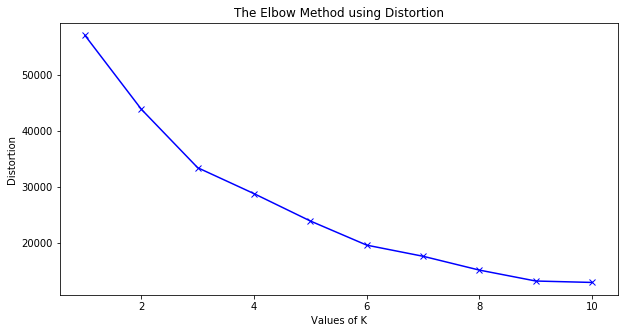

In [17]:
plt.figure(figsize=(10,5))
plt.plot(K, distortions, 'bx-') 
plt.xlabel('Values of K') 
plt.ylabel('Distortion') 
plt.title('The Elbow Method using Distortion') 
plt.show() 

### Next, I assigned numerical values for all of the music genres:

#### Alternative: 0
#### Country: 1 
#### Dance: 2
#### Electronic: 3
#### Folk: 4
#### Rap: 5
#### Classical: 6 
#### Reggae: 7 
#### Jazz: 8 
#### Rock: 9

In [18]:
y = music.genre
y.unique()
genres = {'Alternative': 0, 'Country': 1, 'Dance': 2, 'Electronic': 3, 'Folk': 4, 'Rap': 5,
          'Classical': 6, 'Reggae': 7, 'Jazz': 8, 'Rock': 9}
y = y.map(genres)
y

671       0
672       0
673       0
674       0
675       0
         ..
153983    9
153984    9
153985    9
153986    9
153987    9
Name: genre, Length: 10000, dtype: int64

In [19]:
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

## K-means

In [21]:
# Defining the k-means
kmeans_cluster = KMeans(n_clusters=10, random_state=1)

# Fit model
%timeit kmeans_cluster.fit(X_std)
y_pred = kmeans_cluster.predict(X_std)

533 ms ± 41.6 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


### In the following plot, the numbers show the cluster each observation has been assigned to by the algorithm and the color denotes the true classes.

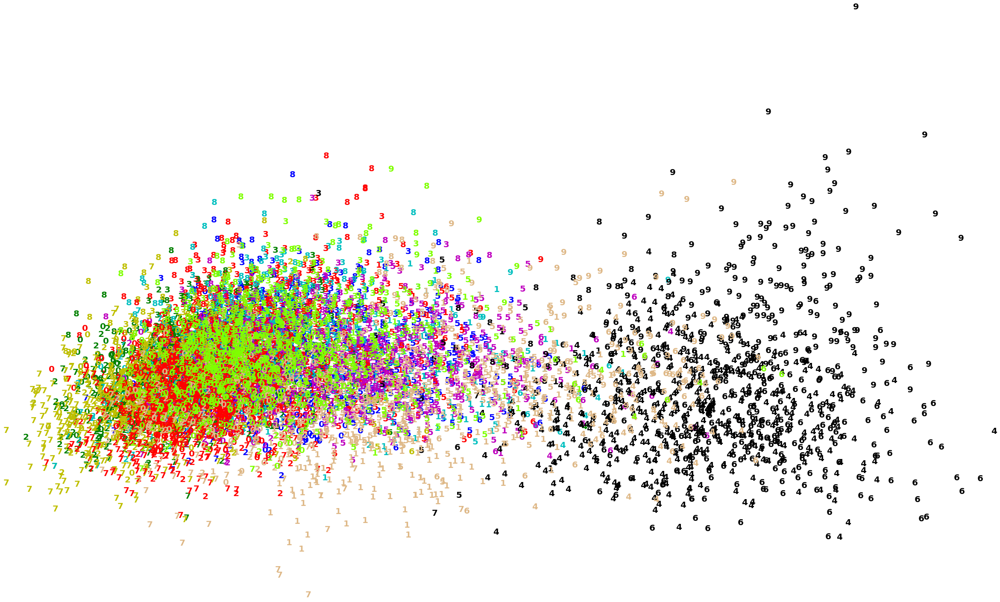

In [22]:
pca = PCA(n_components=2).fit_transform(X_std)

plt.figure(figsize=(4,2))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(y_pred[i]),
             color=colours[int(y.iloc[i])],
             fontdict={'weight': 'bold', 'size': 20}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

### In the following plot, both the numbers and the clusters show the true classes.

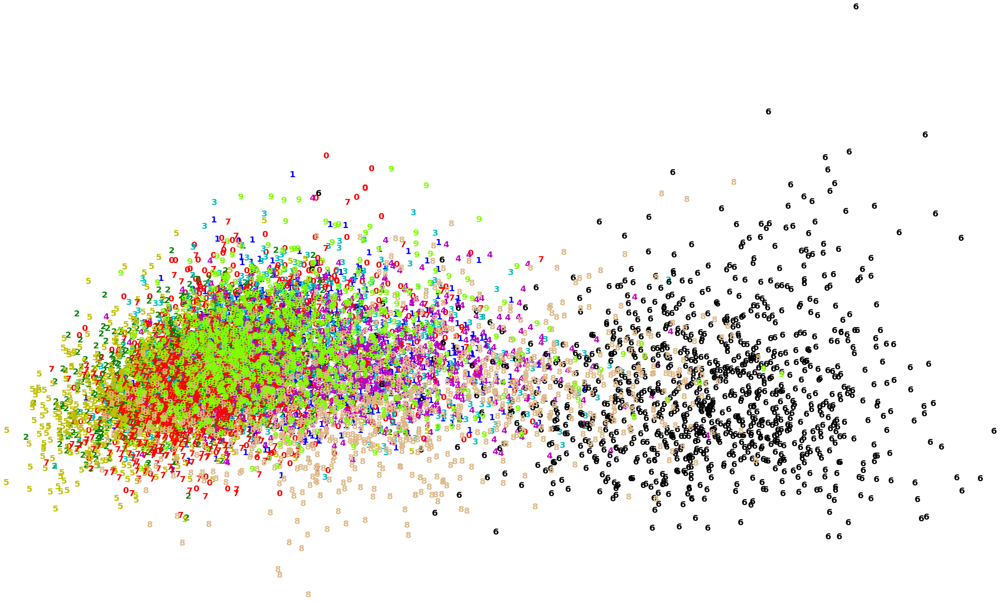

In [23]:
pca = PCA(n_components=2).fit_transform(X_std)

plt.figure(figsize=(4,2))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(y.iloc[i]),
             color=colours[int(y.iloc[i])],
             fontdict={'weight': 'bold', 'size': 20}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

The following contingency table shows the number of observations in each class against the clusters that are assigned to them.  While the cluster numbers are assigned randomly, there are only a few groupings, such as 6 (classical) assigned primarily to cluster 4, and 1 (country) assigned primarily to cluster 0, that suggest that k-means is not able to clearly distinguish between most of the genres of music.

In [24]:
print('Comparing k-means clusters against the data:')
pd.crosstab(y_pred, y)

Comparing k-means clusters against the data:


genre,0,1,2,3,4,5,6,7,8,9
row_0,,,,,,,,,,
0,195,404,288,98,217,138,0,363,102,247
1,26,1,4,196,24,0,4,12,250,50
2,249,86,354,263,99,257,0,334,111,202
3,297,238,194,219,165,135,2,76,23,279
4,0,0,1,6,6,0,503,0,46,3
5,87,190,39,22,423,35,16,30,267,123
6,5,7,3,5,19,4,276,1,41,8
7,73,22,82,96,8,388,2,141,62,10
8,68,51,35,91,39,43,19,39,31,72


### Let's take a look at the ascending values of each of the features 

In [31]:
music.groupby(by = 'genre')[['popularity',	'acousticness',	'danceability',	'duration_ms',	'energy',	'instrumentalness',	'key',	'liveness',	'loudness',	'mode',	'speechiness',	'tempo',	'time_signature',	'valence']].mean().sort_values('popularity', ascending=False)

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence
genre,,,,,,,,,,,
Rap,75.692,0.190760,0.733025,215596.594,0.601733,0.003721,0.181971,-6.736393,0.186948,122.953429,0.432573
Dance,72.502,0.169184,0.661115,217024.725,0.674586,0.007778,0.169785,-5.757047,0.088135,119.180158,0.514307
Folk,64.514,0.490040,0.536454,233240.923,0.486503,0.056683,0.155417,-9.904980,0.045139,117.952438,0.443617
Alternative,62.835,0.157403,0.547605,229485.988,0.710571,0.039001,0.187116,-6.346751,0.085349,121.521301,0.459018
Rock,56.025,0.208435,0.533955,240753.766,0.681842,0.070037,0.192177,-7.328166,0.054679,122.364153,0.500626
Jazz,55.349,0.584720,0.576296,250510.217,0.383506,0.354752,0.157335,-12.302780,0.075275,107.350848,0.454072
Electronic,53.679,0.111665,0.609406,249540.090,0.756027,0.231368,0.205134,-6.233800,0.099082,127.535418,0.366765
Reggae,51.163,0.166408,0.712796,238403.056,0.629836,0.022773,0.165650,-7.287909,0.108840,118.901450,0.663705
Country,42.694,0.268864,0.581959,217487.379,0.625828,0.007321,0.189052,-7.667517,0.050829,122.575441,0.542257


In [65]:
music.groupby(by = 'genre')[['popularity',	'acousticness',	'danceability',	'duration_ms',	'energy',	'instrumentalness',	'key',	'liveness',	'loudness',	'mode',	'speechiness',	'tempo',	'time_signature',	'valence']].mean().sort_values('acousticness', ascending=False)

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence
genre,,,,,,,,,,,
Classical,18.417,0.952302,0.325848,261560.172,0.110147,0.553174,0.196497,-23.800752,0.060052,104.408041,0.264114
Jazz,55.349,0.584720,0.576296,250510.217,0.383506,0.354752,0.157335,-12.302780,0.075275,107.350848,0.454072
Folk,64.514,0.490040,0.536454,233240.923,0.486503,0.056683,0.155417,-9.904980,0.045139,117.952438,0.443617
Country,42.694,0.268864,0.581959,217487.379,0.625828,0.007321,0.189052,-7.667517,0.050829,122.575441,0.542257
Rock,56.025,0.208435,0.533955,240753.766,0.681842,0.070037,0.192177,-7.328166,0.054679,122.364153,0.500626
Rap,75.692,0.190760,0.733025,215596.594,0.601733,0.003721,0.181971,-6.736393,0.186948,122.953429,0.432573
Dance,72.502,0.169184,0.661115,217024.725,0.674586,0.007778,0.169785,-5.757047,0.088135,119.180158,0.514307
Reggae,51.163,0.166408,0.712796,238403.056,0.629836,0.022773,0.165650,-7.287909,0.108840,118.901450,0.663705
Alternative,62.835,0.157403,0.547605,229485.988,0.710571,0.039001,0.187116,-6.346751,0.085349,121.521301,0.459018


In [66]:
music.groupby(by = 'genre')[['popularity',	'acousticness',	'danceability',	'duration_ms',	'energy',	'instrumentalness',	'key',	'liveness',	'loudness',	'mode',	'speechiness',	'tempo',	'time_signature',	'valence']].mean().sort_values('danceability', ascending=False)

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence
genre,,,,,,,,,,,
Rap,75.692,0.190760,0.733025,215596.594,0.601733,0.003721,0.181971,-6.736393,0.186948,122.953429,0.432573
Reggae,51.163,0.166408,0.712796,238403.056,0.629836,0.022773,0.165650,-7.287909,0.108840,118.901450,0.663705
Dance,72.502,0.169184,0.661115,217024.725,0.674586,0.007778,0.169785,-5.757047,0.088135,119.180158,0.514307
Electronic,53.679,0.111665,0.609406,249540.090,0.756027,0.231368,0.205134,-6.233800,0.099082,127.535418,0.366765
Country,42.694,0.268864,0.581959,217487.379,0.625828,0.007321,0.189052,-7.667517,0.050829,122.575441,0.542257
Jazz,55.349,0.584720,0.576296,250510.217,0.383506,0.354752,0.157335,-12.302780,0.075275,107.350848,0.454072
Alternative,62.835,0.157403,0.547605,229485.988,0.710571,0.039001,0.187116,-6.346751,0.085349,121.521301,0.459018
Folk,64.514,0.490040,0.536454,233240.923,0.486503,0.056683,0.155417,-9.904980,0.045139,117.952438,0.443617
Rock,56.025,0.208435,0.533955,240753.766,0.681842,0.070037,0.192177,-7.328166,0.054679,122.364153,0.500626


In [67]:
music.groupby(by = 'genre')[['popularity',	'acousticness',	'danceability',	'duration_ms',	'energy',	'instrumentalness',	'key',	'liveness',	'loudness',	'mode',	'speechiness',	'tempo',	'time_signature',	'valence']].mean().sort_values('duration_ms', ascending=False)

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence
genre,,,,,,,,,,,
Classical,18.417,0.952302,0.325848,261560.172,0.110147,0.553174,0.196497,-23.800752,0.060052,104.408041,0.264114
Jazz,55.349,0.584720,0.576296,250510.217,0.383506,0.354752,0.157335,-12.302780,0.075275,107.350848,0.454072
Electronic,53.679,0.111665,0.609406,249540.090,0.756027,0.231368,0.205134,-6.233800,0.099082,127.535418,0.366765
Rock,56.025,0.208435,0.533955,240753.766,0.681842,0.070037,0.192177,-7.328166,0.054679,122.364153,0.500626
Reggae,51.163,0.166408,0.712796,238403.056,0.629836,0.022773,0.165650,-7.287909,0.108840,118.901450,0.663705
Folk,64.514,0.490040,0.536454,233240.923,0.486503,0.056683,0.155417,-9.904980,0.045139,117.952438,0.443617
Alternative,62.835,0.157403,0.547605,229485.988,0.710571,0.039001,0.187116,-6.346751,0.085349,121.521301,0.459018
Country,42.694,0.268864,0.581959,217487.379,0.625828,0.007321,0.189052,-7.667517,0.050829,122.575441,0.542257
Dance,72.502,0.169184,0.661115,217024.725,0.674586,0.007778,0.169785,-5.757047,0.088135,119.180158,0.514307


In [68]:
music.groupby(by = 'genre')[['popularity',	'acousticness',	'danceability',	'duration_ms',	'energy',	'instrumentalness',	'key',	'liveness',	'loudness',	'mode',	'speechiness',	'tempo',	'time_signature',	'valence']].mean().sort_values('energy', ascending=False)

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence
genre,,,,,,,,,,,
Electronic,53.679,0.111665,0.609406,249540.090,0.756027,0.231368,0.205134,-6.233800,0.099082,127.535418,0.366765
Alternative,62.835,0.157403,0.547605,229485.988,0.710571,0.039001,0.187116,-6.346751,0.085349,121.521301,0.459018
Rock,56.025,0.208435,0.533955,240753.766,0.681842,0.070037,0.192177,-7.328166,0.054679,122.364153,0.500626
Dance,72.502,0.169184,0.661115,217024.725,0.674586,0.007778,0.169785,-5.757047,0.088135,119.180158,0.514307
Reggae,51.163,0.166408,0.712796,238403.056,0.629836,0.022773,0.165650,-7.287909,0.108840,118.901450,0.663705
Country,42.694,0.268864,0.581959,217487.379,0.625828,0.007321,0.189052,-7.667517,0.050829,122.575441,0.542257
Rap,75.692,0.190760,0.733025,215596.594,0.601733,0.003721,0.181971,-6.736393,0.186948,122.953429,0.432573
Folk,64.514,0.490040,0.536454,233240.923,0.486503,0.056683,0.155417,-9.904980,0.045139,117.952438,0.443617
Jazz,55.349,0.584720,0.576296,250510.217,0.383506,0.354752,0.157335,-12.302780,0.075275,107.350848,0.454072


In [69]:
music.groupby(by = 'genre')[['popularity',	'acousticness',	'danceability',	'duration_ms',	'energy',	'instrumentalness',	'key',	'liveness',	'loudness',	'mode',	'speechiness',	'tempo',	'time_signature',	'valence']].mean().sort_values('instrumentalness', ascending=False)

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence
genre,,,,,,,,,,,
Classical,18.417,0.952302,0.325848,261560.172,0.110147,0.553174,0.196497,-23.800752,0.060052,104.408041,0.264114
Jazz,55.349,0.584720,0.576296,250510.217,0.383506,0.354752,0.157335,-12.302780,0.075275,107.350848,0.454072
Electronic,53.679,0.111665,0.609406,249540.090,0.756027,0.231368,0.205134,-6.233800,0.099082,127.535418,0.366765
Rock,56.025,0.208435,0.533955,240753.766,0.681842,0.070037,0.192177,-7.328166,0.054679,122.364153,0.500626
Folk,64.514,0.490040,0.536454,233240.923,0.486503,0.056683,0.155417,-9.904980,0.045139,117.952438,0.443617
Alternative,62.835,0.157403,0.547605,229485.988,0.710571,0.039001,0.187116,-6.346751,0.085349,121.521301,0.459018
Reggae,51.163,0.166408,0.712796,238403.056,0.629836,0.022773,0.165650,-7.287909,0.108840,118.901450,0.663705
Dance,72.502,0.169184,0.661115,217024.725,0.674586,0.007778,0.169785,-5.757047,0.088135,119.180158,0.514307
Country,42.694,0.268864,0.581959,217487.379,0.625828,0.007321,0.189052,-7.667517,0.050829,122.575441,0.542257


In [70]:
music.groupby(by = 'genre')[['popularity',	'acousticness',	'danceability',	'duration_ms',	'energy',	'instrumentalness',	'key',	'liveness',	'loudness',	'mode',	'speechiness',	'tempo',	'time_signature',	'valence']].mean().sort_values('liveness', ascending=False)

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence
genre,,,,,,,,,,,
Electronic,53.679,0.111665,0.609406,249540.090,0.756027,0.231368,0.205134,-6.233800,0.099082,127.535418,0.366765
Classical,18.417,0.952302,0.325848,261560.172,0.110147,0.553174,0.196497,-23.800752,0.060052,104.408041,0.264114
Rock,56.025,0.208435,0.533955,240753.766,0.681842,0.070037,0.192177,-7.328166,0.054679,122.364153,0.500626
Country,42.694,0.268864,0.581959,217487.379,0.625828,0.007321,0.189052,-7.667517,0.050829,122.575441,0.542257
Alternative,62.835,0.157403,0.547605,229485.988,0.710571,0.039001,0.187116,-6.346751,0.085349,121.521301,0.459018
Rap,75.692,0.190760,0.733025,215596.594,0.601733,0.003721,0.181971,-6.736393,0.186948,122.953429,0.432573
Dance,72.502,0.169184,0.661115,217024.725,0.674586,0.007778,0.169785,-5.757047,0.088135,119.180158,0.514307
Reggae,51.163,0.166408,0.712796,238403.056,0.629836,0.022773,0.165650,-7.287909,0.108840,118.901450,0.663705
Jazz,55.349,0.584720,0.576296,250510.217,0.383506,0.354752,0.157335,-12.302780,0.075275,107.350848,0.454072


In [71]:
music.groupby(by = 'genre')[['popularity',	'acousticness',	'danceability',	'duration_ms',	'energy',	'instrumentalness',	'key',	'liveness',	'loudness',	'mode',	'speechiness',	'tempo',	'time_signature',	'valence']].mean().sort_values('loudness', ascending=False)

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence
genre,,,,,,,,,,,
Dance,72.502,0.169184,0.661115,217024.725,0.674586,0.007778,0.169785,-5.757047,0.088135,119.180158,0.514307
Electronic,53.679,0.111665,0.609406,249540.090,0.756027,0.231368,0.205134,-6.233800,0.099082,127.535418,0.366765
Alternative,62.835,0.157403,0.547605,229485.988,0.710571,0.039001,0.187116,-6.346751,0.085349,121.521301,0.459018
Rap,75.692,0.190760,0.733025,215596.594,0.601733,0.003721,0.181971,-6.736393,0.186948,122.953429,0.432573
Reggae,51.163,0.166408,0.712796,238403.056,0.629836,0.022773,0.165650,-7.287909,0.108840,118.901450,0.663705
Rock,56.025,0.208435,0.533955,240753.766,0.681842,0.070037,0.192177,-7.328166,0.054679,122.364153,0.500626
Country,42.694,0.268864,0.581959,217487.379,0.625828,0.007321,0.189052,-7.667517,0.050829,122.575441,0.542257
Folk,64.514,0.490040,0.536454,233240.923,0.486503,0.056683,0.155417,-9.904980,0.045139,117.952438,0.443617
Jazz,55.349,0.584720,0.576296,250510.217,0.383506,0.354752,0.157335,-12.302780,0.075275,107.350848,0.454072


In [72]:
music.groupby(by = 'genre')[['popularity',	'acousticness',	'danceability',	'duration_ms',	'energy',	'instrumentalness',	'key',	'liveness',	'loudness',	'mode',	'speechiness',	'tempo',	'time_signature',	'valence']].mean().sort_values('speechiness', ascending=False)

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence
genre,,,,,,,,,,,
Rap,75.692,0.190760,0.733025,215596.594,0.601733,0.003721,0.181971,-6.736393,0.186948,122.953429,0.432573
Reggae,51.163,0.166408,0.712796,238403.056,0.629836,0.022773,0.165650,-7.287909,0.108840,118.901450,0.663705
Electronic,53.679,0.111665,0.609406,249540.090,0.756027,0.231368,0.205134,-6.233800,0.099082,127.535418,0.366765
Dance,72.502,0.169184,0.661115,217024.725,0.674586,0.007778,0.169785,-5.757047,0.088135,119.180158,0.514307
Alternative,62.835,0.157403,0.547605,229485.988,0.710571,0.039001,0.187116,-6.346751,0.085349,121.521301,0.459018
Jazz,55.349,0.584720,0.576296,250510.217,0.383506,0.354752,0.157335,-12.302780,0.075275,107.350848,0.454072
Classical,18.417,0.952302,0.325848,261560.172,0.110147,0.553174,0.196497,-23.800752,0.060052,104.408041,0.264114
Rock,56.025,0.208435,0.533955,240753.766,0.681842,0.070037,0.192177,-7.328166,0.054679,122.364153,0.500626
Country,42.694,0.268864,0.581959,217487.379,0.625828,0.007321,0.189052,-7.667517,0.050829,122.575441,0.542257


In [73]:
music.groupby(by = 'genre')[['popularity',	'acousticness',	'danceability',	'duration_ms',	'energy',	'instrumentalness',	'key',	'liveness',	'loudness',	'mode',	'speechiness',	'tempo',	'time_signature',	'valence']].mean().sort_values('tempo', ascending=False)

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence
genre,,,,,,,,,,,
Electronic,53.679,0.111665,0.609406,249540.090,0.756027,0.231368,0.205134,-6.233800,0.099082,127.535418,0.366765
Rap,75.692,0.190760,0.733025,215596.594,0.601733,0.003721,0.181971,-6.736393,0.186948,122.953429,0.432573
Country,42.694,0.268864,0.581959,217487.379,0.625828,0.007321,0.189052,-7.667517,0.050829,122.575441,0.542257
Rock,56.025,0.208435,0.533955,240753.766,0.681842,0.070037,0.192177,-7.328166,0.054679,122.364153,0.500626
Alternative,62.835,0.157403,0.547605,229485.988,0.710571,0.039001,0.187116,-6.346751,0.085349,121.521301,0.459018
Dance,72.502,0.169184,0.661115,217024.725,0.674586,0.007778,0.169785,-5.757047,0.088135,119.180158,0.514307
Reggae,51.163,0.166408,0.712796,238403.056,0.629836,0.022773,0.165650,-7.287909,0.108840,118.901450,0.663705
Folk,64.514,0.490040,0.536454,233240.923,0.486503,0.056683,0.155417,-9.904980,0.045139,117.952438,0.443617
Jazz,55.349,0.584720,0.576296,250510.217,0.383506,0.354752,0.157335,-12.302780,0.075275,107.350848,0.454072


In [74]:
music.groupby(by = 'genre')[['popularity',	'acousticness',	'danceability',	'duration_ms',	'energy',	'instrumentalness',	'key',	'liveness',	'loudness',	'mode',	'speechiness',	'tempo',	'time_signature',	'valence']].mean().sort_values('valence', ascending=False)

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence
genre,,,,,,,,,,,
Reggae,51.163,0.166408,0.712796,238403.056,0.629836,0.022773,0.165650,-7.287909,0.108840,118.901450,0.663705
Country,42.694,0.268864,0.581959,217487.379,0.625828,0.007321,0.189052,-7.667517,0.050829,122.575441,0.542257
Dance,72.502,0.169184,0.661115,217024.725,0.674586,0.007778,0.169785,-5.757047,0.088135,119.180158,0.514307
Rock,56.025,0.208435,0.533955,240753.766,0.681842,0.070037,0.192177,-7.328166,0.054679,122.364153,0.500626
Alternative,62.835,0.157403,0.547605,229485.988,0.710571,0.039001,0.187116,-6.346751,0.085349,121.521301,0.459018
Jazz,55.349,0.584720,0.576296,250510.217,0.383506,0.354752,0.157335,-12.302780,0.075275,107.350848,0.454072
Folk,64.514,0.490040,0.536454,233240.923,0.486503,0.056683,0.155417,-9.904980,0.045139,117.952438,0.443617
Rap,75.692,0.190760,0.733025,215596.594,0.601733,0.003721,0.181971,-6.736393,0.186948,122.953429,0.432573
Electronic,53.679,0.111665,0.609406,249540.090,0.756027,0.231368,0.205134,-6.233800,0.099082,127.535418,0.366765


### It appears that classical music stands out the most in terms of it's values for most of the features

### As you can see, classical music (6: black), definitely stands out as it's own cluster

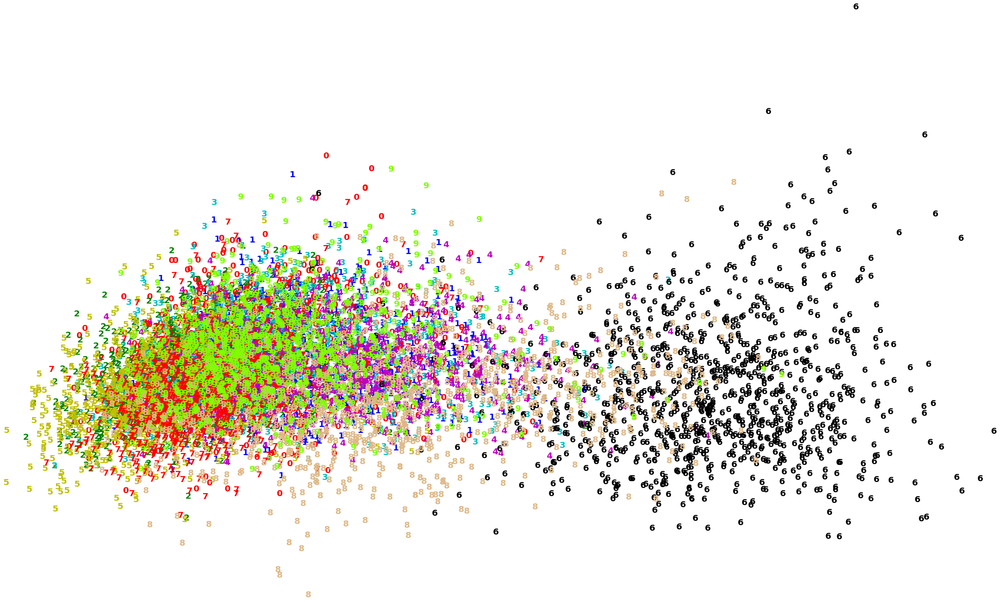

In [25]:
pca = PCA(n_components=2).fit_transform(X_std)

plt.figure(figsize=(4,2))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(y.iloc[i]),
             color=colours[int(y.iloc[i])],
             fontdict={'weight': 'bold', 'size': 20}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

## Evaluating Clusters

In [28]:
X_half1, X_half2, X_pcahalf1, X_pcahalf2 = train_test_split(
    X_std,
    pca,
    test_size=0.5,
    random_state=1)

In [29]:
# Data frame to store features and predicted cluster memberships.
ypred = pd.DataFrame()

# Pass a list of tuples and a counter that increments each time we go
# through the loop. The tuples are the data to be used by k-means,
# and the PCA-derived features for graphing. We use k-means to fit a
# model to the data, then store the predicted values and the two-feature
# PCA solution in the data frame.
for counter, data in enumerate([
    (X_half1, X_pcahalf1),
    (X_half2, X_pcahalf2)]):
    
    # Put the features into ypred.
    ypred['pca_f1' + '_sample' + str(counter)] = data[1][:, 0]
    ypred['pca_f2' + '_sample' + str(counter)] = data[1][:, 1]
    
    # Generate cluster predictions and store them for clusters 2 to 4.
    for nclust in range(2, 11):
        pred = KMeans(n_clusters=nclust, random_state=123).fit_predict(data[counter])
        ypred['clust' + str(nclust) + '_sample' + str(counter)] = pred

### Let's take a look at how well the datset can be divided into clusters as the number of clusters ranges from 2 to 10, both before and after PCA (principal component analysis)

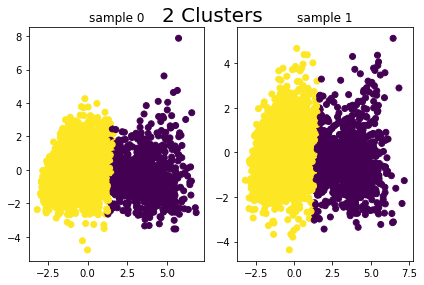

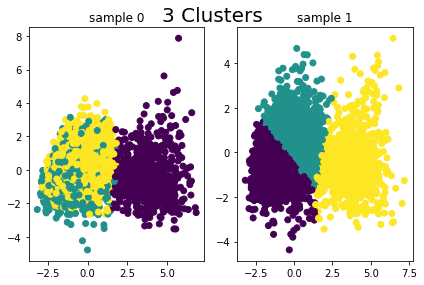

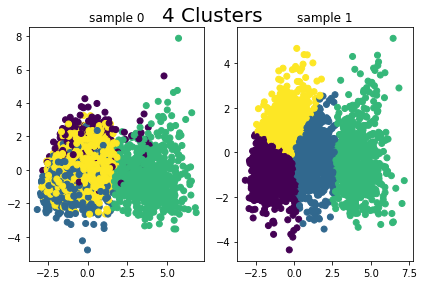

In [30]:
# For each  number of clusters, plot the clusters using the
# pca features for each sample.
for cluster in range(2, 5):
    
    # Make a grid of subplots.
    f, axarr = plt.subplots(1, 2)
    
    # Make a plot for each sample.
    for i in range(2):
        
        # PCA-created features.
        x_sub = ypred['pca_f1_sample{}'.format(i)]
        y_sub = ypred['pca_f2_sample{}'.format(i)]
        
        # Cluster assignments.
        c = ypred['clust{}_sample{}'.format(cluster, i)]
        
        # Assign the subplot to its place on the grid.
        axarr[i].scatter(x_sub, y_sub, c=c)
        axarr[i].set_title('sample {}'.format(i))
    
    # Space out the plots so that the headings don't overlap axis values.
    plt.suptitle('{} Clusters'.format(cluster), fontsize=20)
    plt.tight_layout()
    plt.show()
    print('\n')

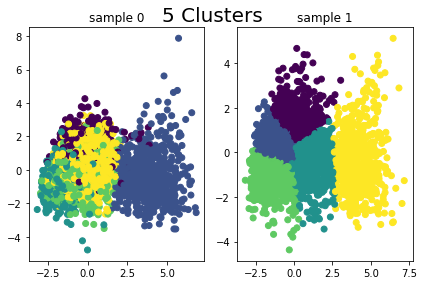

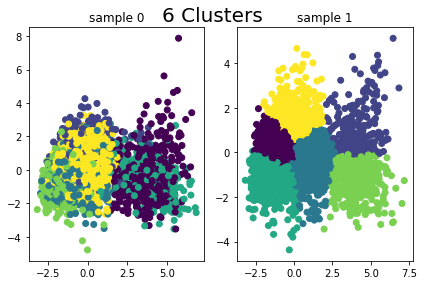

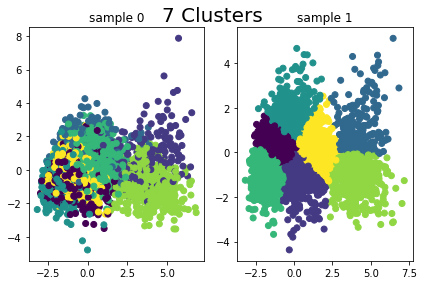

In [31]:
# For each  number of clusters, plot the clusters using the
# pca features for each sample.
for cluster in range(5, 8):
    
    # Make a grid of subplots.
    f, axarr = plt.subplots(1, 2)
    
    # Make a plot for each sample.
    for i in range(2):
        
        # PCA-created features.
        x_sub = ypred['pca_f1_sample{}'.format(i)]
        y_sub = ypred['pca_f2_sample{}'.format(i)]
        
        # Cluster assignments.
        c = ypred['clust{}_sample{}'.format(cluster, i)]
        
        # Assign the subplot to its place on the grid.
        axarr[i].scatter(x_sub, y_sub, c=c)
        axarr[i].set_title('sample {}'.format(i))
    
    # Space out the plots so that the headings don't overlap axis values.
    plt.suptitle('{} Clusters'.format(cluster), fontsize=20)
    plt.tight_layout()
    plt.show()
    print('\n')

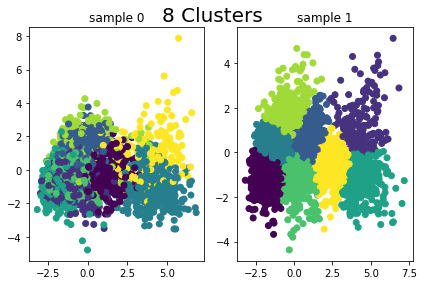

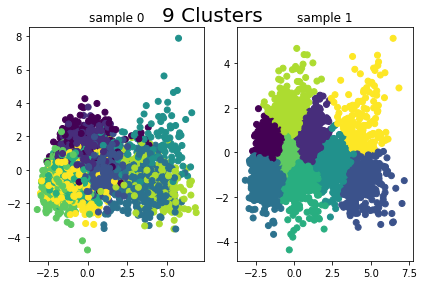

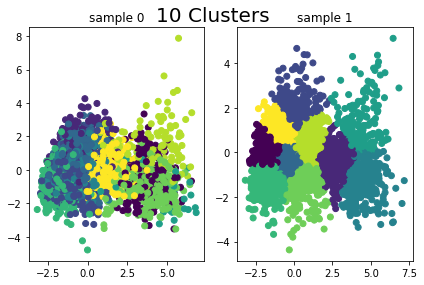

In [32]:
# For each  number of clusters, plot the clusters using the
# pca features for each sample.
for cluster in range(8, 11):
    
    # Make a grid of subplots.
    f, axarr = plt.subplots(1, 2)
    
    # Make a plot for each sample.
    for i in range(2):
        
        # PCA-created features.
        x_sub = ypred['pca_f1_sample{}'.format(i)]
        y_sub = ypred['pca_f2_sample{}'.format(i)]
        
        # Cluster assignments.
        c = ypred['clust{}_sample{}'.format(cluster, i)]
        
        # Assign the subplot to its place on the grid.
        axarr[i].scatter(x_sub, y_sub, c=c)
        axarr[i].set_title('sample {}'.format(i))
    
    # Space out the plots so that the headings don't overlap axis values.
    plt.suptitle('{} Clusters'.format(cluster), fontsize=20)
    plt.tight_layout()
    plt.show()
    print('\n')

### As you can see, as the number of clusters increases, the computer's ability to assign distinct clusters before PCA (sample 0) becomes worse compared to it's ability to assign clusters after PCA (sample 1) 

In [33]:
# Get predicted clusters.
full_pred = KMeans(n_clusters=10, random_state=123).fit_predict(X_std)

pd.crosstab(full_pred, y)

genre,0,1,2,3,4,5,6,7,8,9
row_0,,,,,,,,,,
0,75,52,39,99,41,44,4,42,30,73
1,242,305,245,200,185,149,0,213,94,262
2,239,362,237,171,223,136,2,229,94,288
3,0,1,0,12,0,0,163,4,67,9
4,1,0,1,33,18,0,456,0,154,13
5,88,159,40,26,410,29,17,26,271,112
6,278,90,358,363,105,260,0,340,209,227
7,0,1,0,1,0,0,315,0,5,1
8,73,25,77,93,9,378,1,145,72,12


### Let's examine the rand index score, ARI (adjusted rand index score) , and silhouette score for the different number of clusters

In [28]:
pred_2 = KMeans(n_clusters=2, random_state=123).fit_predict(X_std)
pred_3 = KMeans(n_clusters=3, random_state=123).fit_predict(X_std)
pred_4 = KMeans(n_clusters=4, random_state=123).fit_predict(X_std)
pred_5 = KMeans(n_clusters=5, random_state=123).fit_predict(X_std)
pred_6 = KMeans(n_clusters=6, random_state=123).fit_predict(X_std)
pred_7 = KMeans(n_clusters=7, random_state=123).fit_predict(X_std)
pred_8 = KMeans(n_clusters=8, random_state=123).fit_predict(X_std)
pred_9 = KMeans(n_clusters=9, random_state=123).fit_predict(X_std)
pred_10 = KMeans(n_clusters=10, random_state=123).fit_predict(X_std)

def rand_index_score(grount_truths, predictions):
    tp_plus_fp = scipy.special.comb(np.bincount(grount_truths), 2).sum()
    tp_plus_fn = scipy.special.comb(np.bincount(grount_truths), 2).sum()
    A = np.c_[(grount_truths, predictions)]
    tp = sum(scipy.special.comb(np.bincount(A[A[:, 0] == i, 1]), 2).sum()
             for i in set(grount_truths))
    fp = tp_plus_fp - tp
    fn = tp_plus_fn - tp
    tn = scipy.special.comb(len(A), 2) - tp - fp - fn
    return (tp + tn) / (tp + fp + fn + tn)

print('Rand index score for two cluster k-means {}'.format(rand_index_score(y, pred_2)))
print('Rand index score for three cluster k-means {}'.format(rand_index_score(y, pred_3)))
print('Rand index score for four cluster k-means {}'.format(rand_index_score(y, pred_4)))
print('Rand index score for five cluster k-means {}'.format(rand_index_score(y, pred_5)))
print('Rand index score for six cluster k-means {}'.format(rand_index_score(y, pred_6)))
print('Rand index score for seven cluster k-means {}'.format(rand_index_score(y, pred_7)))
print('Rand index score for eight cluster k-means {}'.format(rand_index_score(y, pred_8)))
print('Rand index score for nine cluster k-means {}'.format(rand_index_score(y, pred_9)))
print('Rand index score for ten cluster k-means {}'.format(rand_index_score(y, pred_10)))

Rand index score for two cluster k-means 0.9804828482848285
Rand index score for three cluster k-means 0.9157261726172617
Rand index score for four cluster k-means 0.8871344334433443
Rand index score for five cluster k-means 0.8788252825282529
Rand index score for six cluster k-means 0.8654235823582358
Rand index score for seven cluster k-means 0.8600855285528552
Rand index score for eight cluster k-means 0.8554988698869886
Rand index score for nine cluster k-means 0.8506186218621862
Rand index score for ten cluster k-means 0.8485791779177918


In [38]:
print("ARI for two cluster k-means: {}".format(
    metrics.adjusted_rand_score(y, pred_2)))
print("ARI for three cluster k-means: {}".format(
    metrics.adjusted_rand_score(y, pred_3)))
print("ARI for four cluster k-means: {}".format(
    metrics.adjusted_rand_score(y, pred_4)))
print("ARI for five cluster k-means: {}".format(
    metrics.adjusted_rand_score(y, pred_5)))
print("ARI for six cluster k-means: {}".format(
    metrics.adjusted_rand_score(y, pred_6)))
print("ARI for seven cluster k-means: {}".format(
    metrics.adjusted_rand_score(y, pred_7)))
print("ARI for eight cluster k-means: {}".format(
    metrics.adjusted_rand_score(y, pred_8)))
print("ARI for nine cluster k-means: {}".format(
    metrics.adjusted_rand_score(y, pred_9)))
print("ARI for ten cluster k-means: {}".format(
    metrics.adjusted_rand_score(y, pred_10)))

ARI for two cluster k-means: 0.049928210595150624
ARI for three cluster k-means: 0.07288186213050547
ARI for four cluster k-means: 0.09928908050235663
ARI for five cluster k-means: 0.11084262193664271
ARI for six cluster k-means: 0.08610999953631504
ARI for seven cluster k-means: 0.08552269365660872
ARI for eight cluster k-means: 0.10226004599005559
ARI for nine cluster k-means: 0.08579771263290267
ARI for ten cluster k-means: 0.07744080905031542


In [81]:
pred_2 = KMeans(n_clusters=2, random_state=123).fit_predict(X_std)
pred_3 = KMeans(n_clusters=3, random_state=123).fit_predict(X_std)
pred_4 = KMeans(n_clusters=4, random_state=123).fit_predict(X_std)
pred_5 = KMeans(n_clusters=5, random_state=123).fit_predict(X_std)
pred_6 = KMeans(n_clusters=6, random_state=123).fit_predict(X_std)
pred_7 = KMeans(n_clusters=7, random_state=123).fit_predict(X_std)
pred_8 = KMeans(n_clusters=8, random_state=123).fit_predict(X_std)
pred_9 = KMeans(n_clusters=9, random_state=123).fit_predict(X_std)
pred_10 = KMeans(n_clusters=10, random_state=123).fit_predict(X_std)

print("Silhouette score for two cluster k-means: {}".format(
    metrics.silhouette_score(X_std, pred_2, metric='euclidean')))
print("Silhouette score for three cluster k-means: {}".format(
    metrics.silhouette_score(X_std, pred_3, metric='euclidean')))
print("Silhouette score for four cluster k-means: {}".format(
    metrics.silhouette_score(X_std, pred_4, metric='euclidean')))
print("Silhouette score for five cluster k-means: {}".format(
    metrics.silhouette_score(X_std, pred_5, metric='euclidean')))
print("Silhouette score for six cluster k-means: {}".format(
    metrics.silhouette_score(X_std, pred_6, metric='euclidean')))
print("Silhouette score for seven cluster k-means: {}".format(
    metrics.silhouette_score(X_std, pred_7, metric='euclidean')))
print("Silhouette score for eight cluster k-means: {}".format(
    metrics.silhouette_score(X_std, pred_8, metric='euclidean')))
print("Silhouette score for nine cluster k-means: {}".format(
    metrics.silhouette_score(X_std, pred_9, metric='euclidean')))
print("Silhouette score for ten cluster k-means: {}".format(
    metrics.silhouette_score(X_std, pred_10, metric='euclidean')))

Silhouette score for two cluster k-means: 0.32379568586259505
Silhouette score for three cluster k-means: 0.13153295060940706
Silhouette score for four cluster k-means: 0.10409634874877699
Silhouette score for five cluster k-means: 0.11114767072486145
Silhouette score for six cluster k-means: 0.1047631826188242
Silhouette score for seven cluster k-means: 0.11042517834023297
Silhouette score for eight cluster k-means: 0.11044151532034996
Silhouette score for nine cluster k-means: 0.1149077402064152
Silhouette score for ten cluster k-means: 0.11514183602500552


Clustering the data into two clusters yields the highest rand index score by far, with a score of 0.9805.  Clustering the data into five clusters yields the highest ARI (adjusted rand index score) of 0.1110, although several of the other ARI scores are very similar.  Clustering the data into two clusters yields the lowest ARI score, but the highest silhouette score.  The two-cluster silhouette score of 0.3238 is far higher than the second highest silhouette score of 0.1156 for six clusters.

## Hierarchical clustering

In [39]:
# Defining the agglomerative clustering
agg_cluster = AgglomerativeClustering(linkage='complete', 
                                      affinity='cosine',
                                      n_clusters=10)

# Fit model
clusters = agg_cluster.fit_predict(X_std)

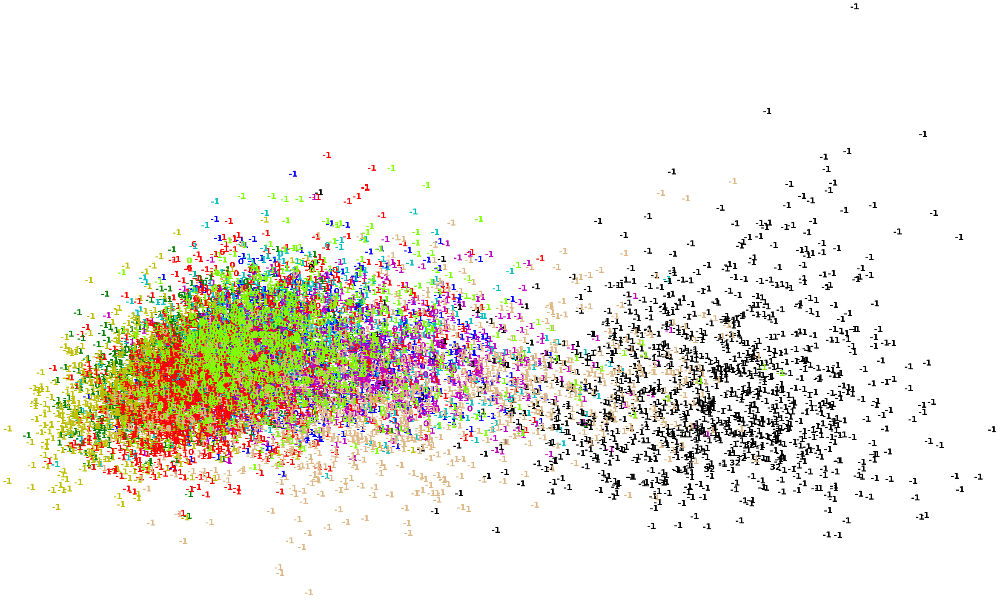

In [24]:
pca = PCA(n_components=2).fit_transform(X_std)

plt.figure(figsize=(4,2))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(clusters[i]),
             color=colours[int(y.iloc[i])],
             fontdict={'weight': 'bold', 'size': 20}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

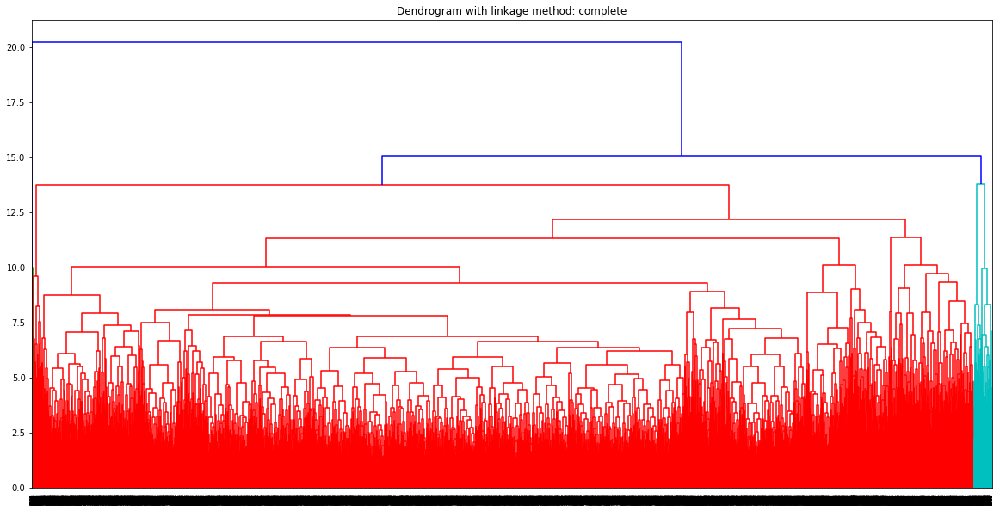

In [41]:
plt.figure(figsize=(20,10))
plt.title("Dendrogram with linkage method: complete")
dendrogram(linkage(X_std, method='complete'))
plt.show()

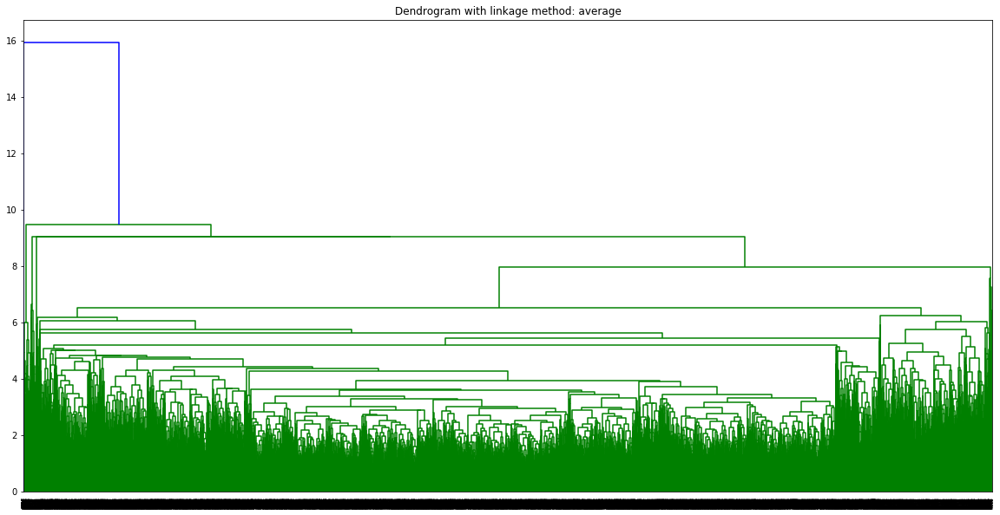

In [43]:
plt.figure(figsize=(20,10))
plt.title("Dendrogram with linkage method: average")
dendrogram(linkage(X_std, method='average'))
plt.show()

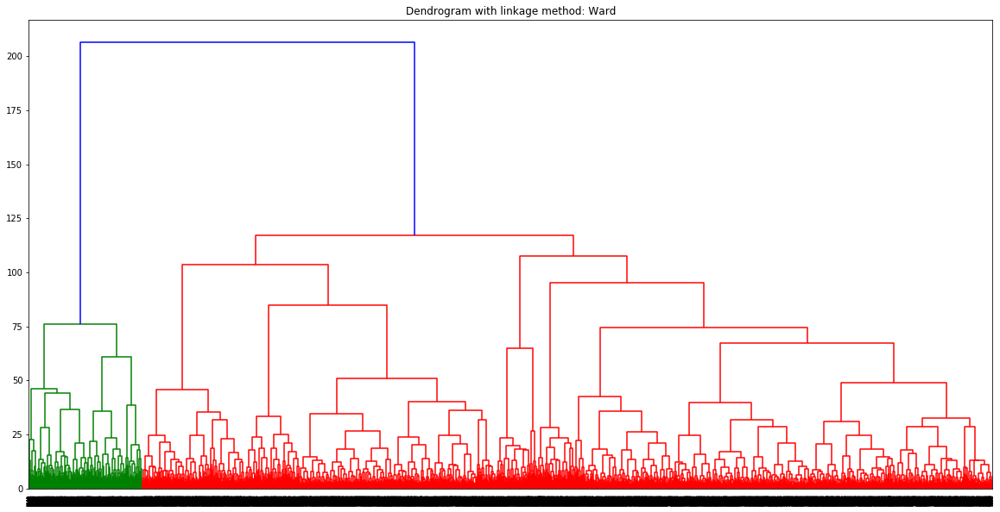

In [44]:
plt.figure(figsize=(20,10))
plt.title("Dendrogram with linkage method: Ward")
dendrogram(linkage(X_std, method='ward'))
plt.show()

In [42]:
linkage_methods = ["ward", "average", "complete"]

# Defining the agglomerative clustering
agg_cluster = AgglomerativeClustering(linkage="average", 
                                      affinity='cosine',
                                      n_clusters=10)

# Fit model
clusters = agg_cluster.fit_predict(X_std)

print("ARI score of linkage method average: {}".format(
    metrics.adjusted_rand_score(y, clusters)))

print("Silhouette score of linkage method average: {}".format(
    metrics.silhouette_score(X_std, clusters, metric='euclidean')))
print("------------------------------------------------")

# Defining the agglomerative clustering
agg_cluster = AgglomerativeClustering(linkage="complete", 
                                      affinity='cosine',
                                      n_clusters=10)

# Fit model
clusters = agg_cluster.fit_predict(X_std)

print("ARI score of linkage method complete: {}".format(
    metrics.adjusted_rand_score(y, clusters)))

print("Silhouette score of linkage method complete: {}".format(
    metrics.silhouette_score(X_std, clusters, metric='euclidean')))
print("------------------------------------------------")

# Defining the agglomerative clustering
agg_cluster = AgglomerativeClustering(linkage="ward", 
                                      affinity='euclidean',
                                      n_clusters=10)

# Fit model
clusters = agg_cluster.fit_predict(X_std)

print("ARI score of linkage method ward: {}".format(
    metrics.adjusted_rand_score(y, clusters)))

print("Silhouette score of linkage method ward: {}".format(
    metrics.silhouette_score(X_std, clusters, metric='euclidean')))

ARI score of linkage method average: 0.1095217742269581
Silhouette score of linkage method average: 0.06351249520112569
------------------------------------------------
ARI score of linkage method complete: 0.06722739911091123
Silhouette score of linkage method complete: 0.024616333422018914
------------------------------------------------
ARI score of linkage method ward: 0.09523027000779205
Silhouette score of linkage method ward: 0.08168654520551798


All three linkage methods produce highly imbalanced dendograms, but the ward method's dendogram is the least imbalanced.

The average linkage method yields the highest ARI score of 0.1095, but the ward linkage method yields the highest silhouette score of  0.0817.  However, all three linkage methods yield lower ARI and silhouette scores than most of the k-means clusters. 

## The DBSCAN approach to clustering

In [25]:
# Defining the agglomerative clustering
dbscan_cluster = DBSCAN(eps=1, min_samples=5)

# Fit model
clusters = dbscan_cluster.fit_predict(X_std)

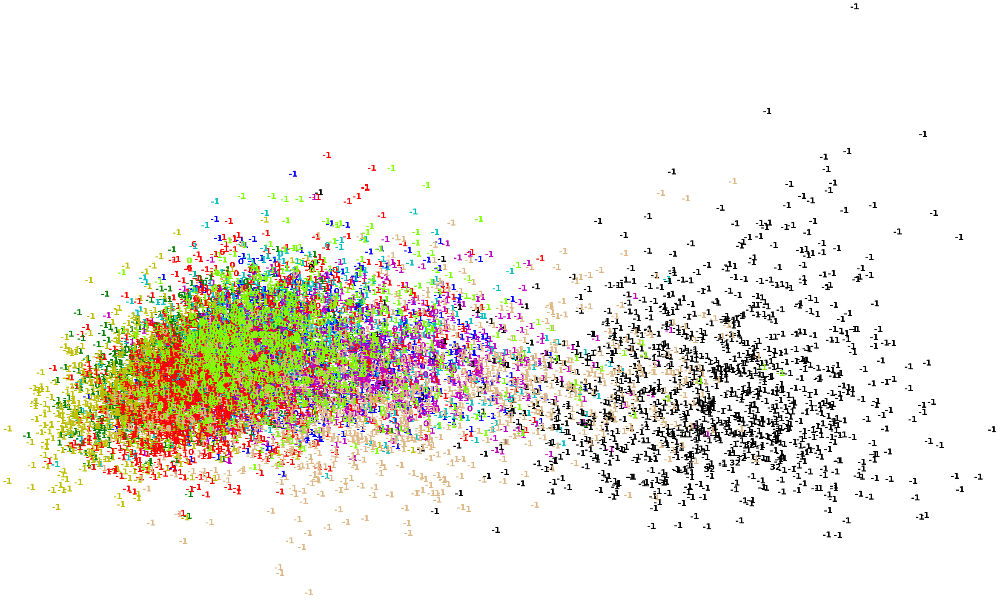

In [26]:
plt.figure(figsize=(4,2))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(clusters[i]),
             color=colours[int(y.iloc[i])],
             fontdict={'weight': 'bold', 'size': 20}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

### The -1's represent noise, so just about everything appears as noise using the DBSCAN approach to clustering

In [27]:
print("Adjusted Rand Index of the DBSCAN solution: {}"
      .format(metrics.adjusted_rand_score(y, clusters)))

print("The silhouette score of the DBSCAN solution: {}"
      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))

Adjusted Rand Index of the DBSCAN solution: 0.013546238962718008
The silhouette score of the DBSCAN solution: -0.393062170629061


#### The DBSCAN approach to clustering yields a low ARI score of 0.0135, and a negative silhouette score of -0.3931.

## Clustering with Gaussian Mixture Models (GMM)

In [45]:
# Defining the agglomerative clustering
gmm_cluster = GaussianMixture(n_components=10, random_state=123)

# Fit model
clusters = gmm_cluster.fit_predict(X_std)

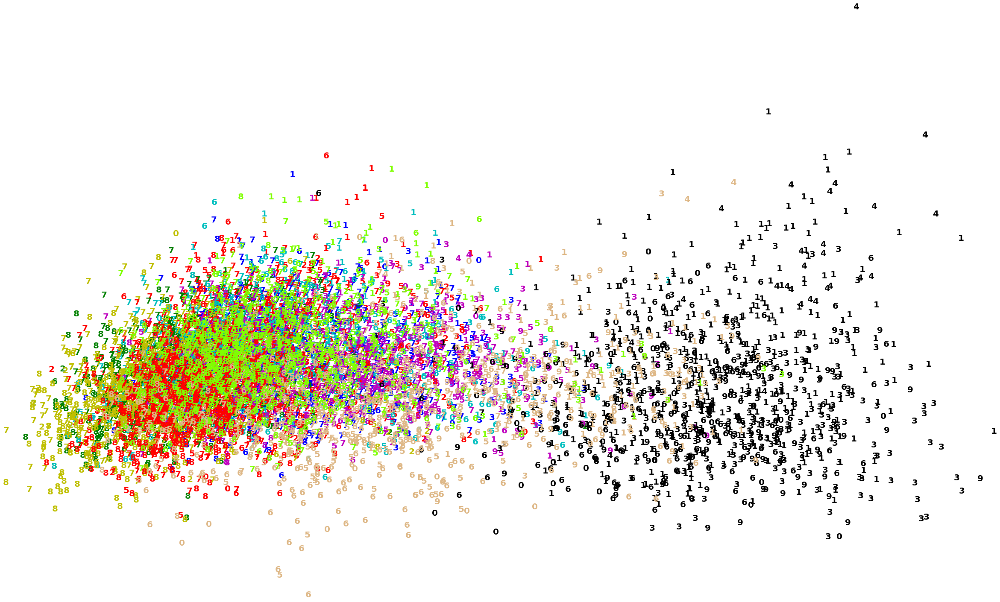

In [46]:
plt.figure(figsize=(4,2))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(clusters[i]),
             color=colours[int(y.iloc[i])],
             fontdict={'weight': 'bold', 'size': 20}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [48]:
print("Adjusted Rand Index of the GMM solution: {}"
      .format(metrics.adjusted_rand_score(y, clusters)))
print("The silhouette score of the GMM solution: {}"
      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))

Adjusted Rand Index of the GMM solution: 0.06473030354440527
The silhouette score of the GMM solution: 0.028125658897278232


In [49]:
pd.crosstab(y, clusters)

col_0,0,1,2,3,4,5,6,7,8,9
genre,,,,,,,,,,
0,5,34,26,27,0,139,82,420,251,16
1,3,36,1,58,0,53,20,733,93,3
2,1,11,22,19,0,23,30,515,374,5
3,15,105,1,8,0,229,278,164,191,9
4,5,51,4,83,2,208,54,479,89,25
5,2,9,38,1,0,35,24,492,397,2
6,49,422,0,227,31,1,169,6,0,95
7,3,21,24,3,0,104,74,422,342,7
8,12,131,3,68,4,176,288,168,103,47


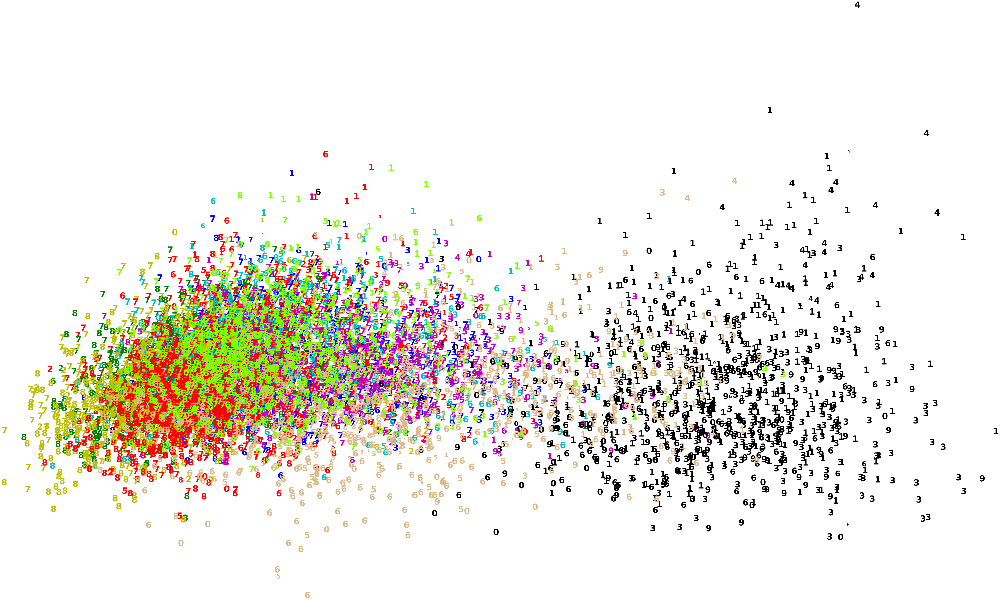

In [50]:
probs = gmm_cluster.predict_proba(X_std)

size = 50 * probs.max(1) ** 2  # square emphasizes differences

plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(clusters[i]),
             color=colours[(y.iloc[i])],
             fontdict={'weight': 'bold', 'size': size[i]}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

#### Clustering with Gaussian Mixture Models (GMM) yields a low ARI score of 0.0647 and low silhouette score of 0.0281.

## Dimensionality Reduction with PCA

In [51]:
# We just want the first two principal components
pca = PCA(n_components=2)

# We get the components by 
# calling fit_transform method with our data
pca_components = pca.fit_transform(X)

In [52]:
plt.figure(figsize=(4,2))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(pca_components.shape[0]):
    plt.text(pca_components[i, 0], pca_components[i, 1], str(y.iloc[i]),
             color=colours[(y.iloc[i])],
             fontdict={'weight': 'bold', 'size': 20}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()
#Unable to plot graph

ValueError: Image size of 340562382x21933 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 288x144 with 1 Axes>

#### Attempting to examine clustering using dimensionality reduction with PCA failed because the graph had too many pixels for the computer to display.

## Dimensionality reduction with t-SNE

In [54]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(X)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.022s...
[t-SNE] Computed neighbors for 10000 samples in 0.347s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 21.140008
[t-SNE] KL divergence after 250 iterations with early exaggeration: 60.025230
[t-SNE] KL divergence after 300 iterations: 1.820532
t-SNE done! Time elapsed

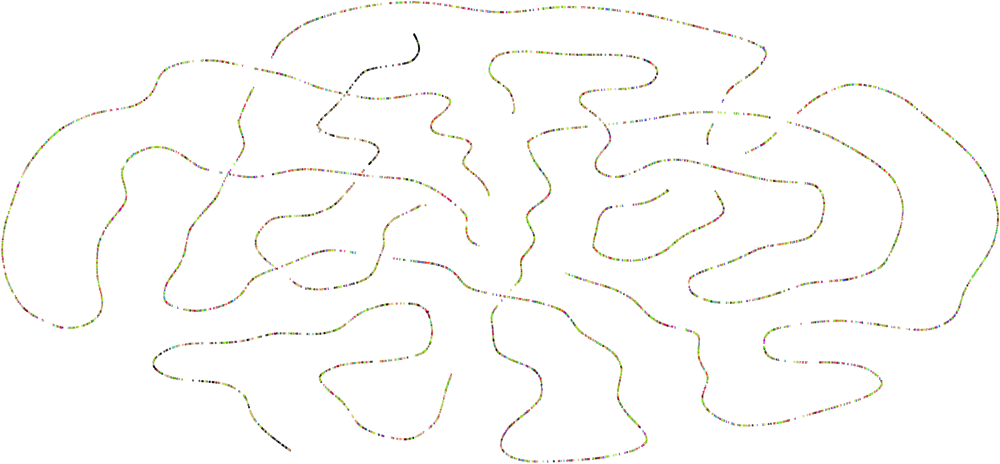

In [55]:
plt.figure(figsize=(4,2))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(tsne_results.shape[0]):
    plt.text(tsne_results[i, 0], tsne_results[i, 1], str(y.iloc[i]),
             color=colours[int(y.iloc[i])],
             fontdict={'weight': 'bold', 'size': 20}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

#### Using t-SNE dimensionality reduction produces an interesting looking plot, but it does not clearly distinguish between the different classes.

## Dimensionality reduction with UMAP

In [164]:
time_start = time.time()

umap_results = umap.UMAP(n_neighbors=5,
                      min_dist=0.3,
                      metric='correlation').fit_transform(X)

print('UMAP done! Time elapsed: {} seconds'.format(time.time()-time_start))

/usr/local/lib/python3.6/dist-packages/umap/rp_tree.py:719: UserWarning: Random Projection forest initialisation failed due to recursionlimit being reached. Something is a little strange with your data, and this may take longer than normal to compute.
  "Random Projection forest initialisation failed due to recursion"
/usr/local/lib/python3.6/dist-packages/numba/typed_passes.py:293: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../usr/local/lib/python3.6/dist-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))
/usr/local/lib/python3.6/dist-packages/umap/spectral.py:229: UserWarning: Embedding a total of 2 separate connected components using meta-embedding (experimental)
  n_components


UMAP done! Time elapsed: 18.31782841682434 seconds


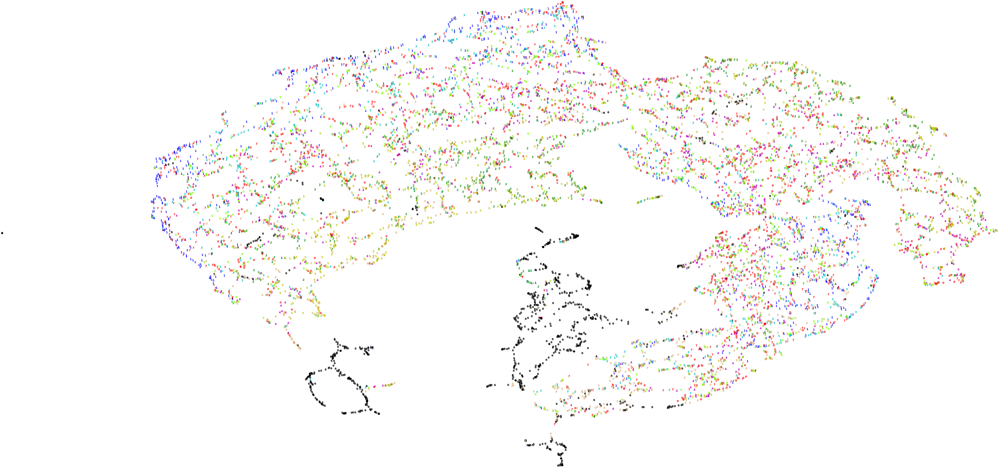

In [10]:
plt.figure(figsize=(4,2))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], y.iloc[i],
             color=colours[(y.iloc[i])],
             fontdict={'weight': 'bold', 'size': 20}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

NameError: name 'umap_results' is not defined

<Figure size 288x144 with 0 Axes>

#### UMAP dimensionality reduction does the best job out of all of the dimensionality reduction methods in seperating the data into distinct clusters.  While many of the data points are still intertwined, it is possible to distinguish several clusters based on their color, with each color representing a specific genre of music. 

# In Summary:

#### I chose a dataset on genres of music, as labeled by Spotify.  The target variable, genre, initially had 26 possible values, from which I selected the following ten values: Alternative, Country, Dance, Electronic, Folk, Rap, Classical, Reggae, Jazz, and Rock.  I used all features in the dataset, except for artist name, track name, and track id.  I mapped all non-numerical features into catagorical numbers, and the remaining features were all continuous variables.  The features were: popularity,	acousticness, danceability,	duration in milliseconds,	energy,	instrumentalness,	key	liveness,	loudness,	mode, speechiness,	tempo,	time_signature, and valence.

#### Interestingly, the correlation between the features and the target variable were not strong enough to seperate the genres into 10 distinct clusters.  As the k value, the number of clusters the algorithms were asked to seperate the dataset into, increased up to the true value of 10, the number of correctly labeled data points decreased until it became only slightly better than what would be expected if the data points had been labeled at random.  This was true for all attempted clustering methods, and for every clustering method the ARI and silhouette scores were relatively low.  I used three dimensionality reduction techniques: PCA, t-SNE, and UMAP.  For the three reduction techniques, python was not able to display the graph for PCA reduction because there were too many pixels in the graph, t-SNE reduction yielded an interesting graph, but not one with easily distinguishable clusters, and only UMAP reduction produced a graph with a few distinguishable clusters.

#### In conclusion, I found it challenging to distinuish different songs based on their genre through unsupervised learning.  It is impressive that Spotify is able to provide listeners with songs based on their genre prefences, and the algorithms Spotify uses to classify music are most likely very complex.  Computers are able to complete mathematical tasks at a rate no human could ever achieve, yet while most humans can distinguish between different types of music with ease, it is far more challenging to enable a computer to do so. 

# Questions?